In [1]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

if IN_COLAB:
    # Create log folder
    !mkdir /content/lightning_logs
    # Download data from google drive
    !wget --output-document data.zip 'https://docs.google.com/uc?export=download&id=1PvPkD7loC9dB3eHfHv6lCu9uHQHqLNsR&confirm=t'
    !unzip -n data.zip -d /content/data
    # Download main script from github
    !wget --output-document amoug.py https://raw.githubusercontent.com/TuchthamSung086/among-us-counter/test_cnn/ML/amoug.py
    # Install dependecy
    !pip install pytorch-lightning
    !pip install kornia

mkdir: cannot create directory ‘/content/lightning_logs’: File exists
--2022-12-03 17:18:52--  https://docs.google.com/uc?export=download&id=1PvPkD7loC9dB3eHfHv6lCu9uHQHqLNsR&confirm=t
Resolving docs.google.com (docs.google.com)... 172.217.194.139, 172.217.194.100, 172.217.194.113, ...
Connecting to docs.google.com (docs.google.com)|172.217.194.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0k-30-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ck1p3siklvlg7esuquingh00gd4279lr/1670087925000/11486309116704137645/*/1PvPkD7loC9dB3eHfHv6lCu9uHQHqLNsR?e=download&uuid=3115340e-143b-46ce-9855-c00db703a7c0 [following]
--2022-12-03 17:18:53--  https://doc-0k-30-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ck1p3siklvlg7esuquingh00gd4279lr/1670087925000/11486309116704137645/*/1PvPkD7loC9dB3eHfHv6lCu9uHQHqLNsR?e=download&uuid=3115340e-143b-46ce-9855-c00db703a7c0
Resolving doc-0k-30-docs.google

In [2]:
import numpy as np
from matplotlib import pyplot as plt

import torchvision as tv
from torchvision.transforms.functional import pil_to_tensor, to_tensor
from torchvision import transforms as T
import torch
from torch import nn
from torchsummary import summary
from torch.nn import functional as F, Sequential
from torch.utils.data import DataLoader, random_split
import pytorch_lightning as pl
from kornia import augmentation as T

In [3]:
from amoug import AmougRCNNModel, AmougDataset, collate_fn, visualize

In [4]:
show = tv.transforms.ToPILImage()

## Prepare Dataset

In [5]:
batch_size = 8   # Data loader's Batch size
visualize_size = 8  # no. of image use when visualize

### Dataset

In [6]:
augmentation = Sequential(
    T.ColorJitter(brightness=0.5, hue=0.5, contrast=0.5),
    T.RandomElasticTransform(),
    T.RandomGaussianBlur(kernel_size=(9, 9), sigma=(0.1, 2.0)),
    T.RandomGrayscale(p=0.1),
    T.RandomSolarize(),
    T.RandomInvert(p=0.1),
)

ds = AmougDataset("data", transform=tv.transforms.ConvertImageDtype(torch.float32))
train_ds, vaildate_ds = random_split(ds, [int(len(ds)*0.8), int(len(ds)*0.2)])
train_ds, vaildate_ds

(<torch.utils.data.dataset.Subset at 0x7f51cc4398b0>,
 <torch.utils.data.dataset.Subset at 0x7f51cc341a60>)

### Data Loader

In [7]:
train_data = DataLoader(train_ds, shuffle=True, batch_size=batch_size, collate_fn=collate_fn)
vaildate_data = DataLoader(vaildate_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn)

In [8]:
# Take a sample batch for testing purposes

sample_batch = next(iter(train_data))

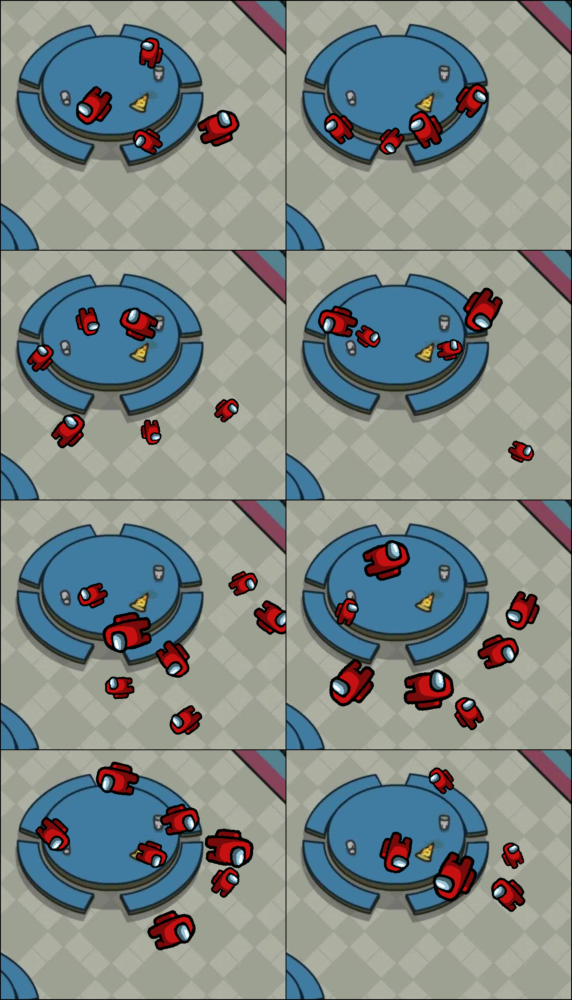

In [9]:
show(tv.utils.make_grid(sample_batch[0][:visualize_size], nrow=int(np.sqrt(visualize_size))))

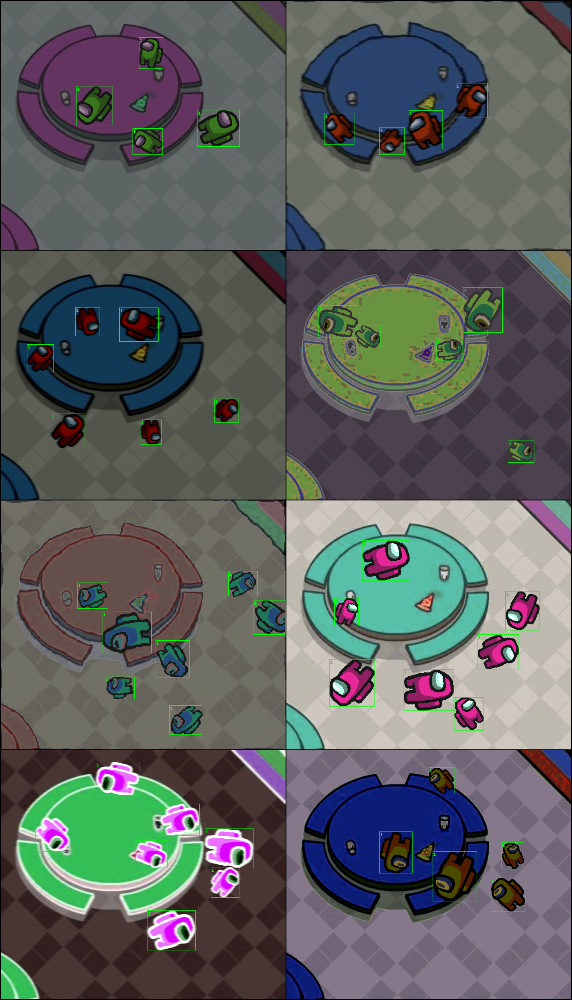

In [10]:
# visualize augmentation
show(visualize(augmentation(sample_batch[0]), sample_batch[1]))

### Sanity Check

In [11]:
if False:
  for imgs, targets in train_data:
    for target in targets:
      for x1, y1, x2, y2 in target['boxes']:
        assert (x2 > x1 and y2 > y1), target

## Model

In [12]:
amoug_model = AmougRCNNModel(augmentation=augmentation)

In [13]:
trainer = pl.Trainer(accelerator="auto")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

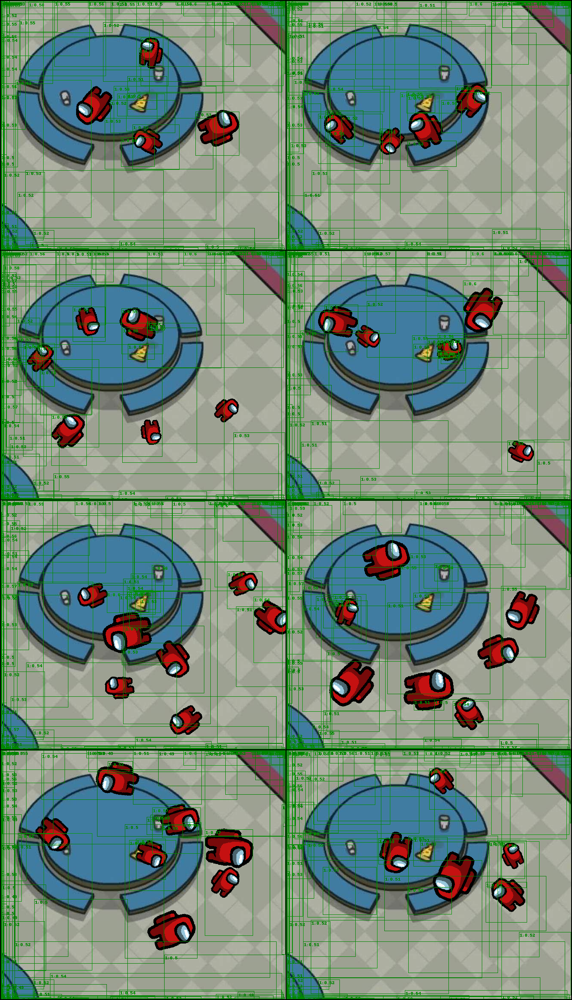

In [14]:
# Visualize a pre-train prediction

results = trainer.predict(amoug_model, DataLoader(sample_batch[0]))
show(visualize(sample_batch[0], results))

In [15]:
# Pre-train validation loss
trainer.validate(amoug_model, dataloaders=vaildate_data)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/data.py:85: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        val_loss            1.2243876457214355
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 1.2243876457214355}]

### Training

In [16]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/

<IPython.core.display.Javascript object>

In [17]:
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

In [18]:
trainer = pl.Trainer(
    accelerator="gpu", 
    # max_epochs=1,
    callbacks=[
        EarlyStopping(monitor="val_loss", mode="min", verbose=True),
        # Save best model (https://github.com/Lightning-AI/lightning/discussions/11787)
        ModelCheckpoint(save_top_k=1, monitor="val_loss", mode="min")
      ],
    # default_root_dir="/content/drive/MyDrive/Data/Amough/M1"
)

# This may train for a very long time
trainer.fit(model=amoug_model, train_dataloaders=train_data, val_dataloaders=vaildate_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
  rank_zero_warn(
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type                 | Params
------------------------------------------------------
0 | augmentation | Sequential           | 0     
1 | model        | FasterRCNN           | 43.3 M
2 | test_map     | MeanAveragePrecision | 0     
------------------------------------------------------
10.2 K    Tra

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.299


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.096 >= min_delta = 0.0. New best score: 0.203


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.183


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.172


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.165


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.161


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.156


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.155


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.152


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.150


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.148


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.146


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.146


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.142


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.142


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.142


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.141


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.139


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.139


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.139


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.139


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.137


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.136


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.135


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.135. Signaling Trainer to stop.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 500it [00:00, ?it/s]

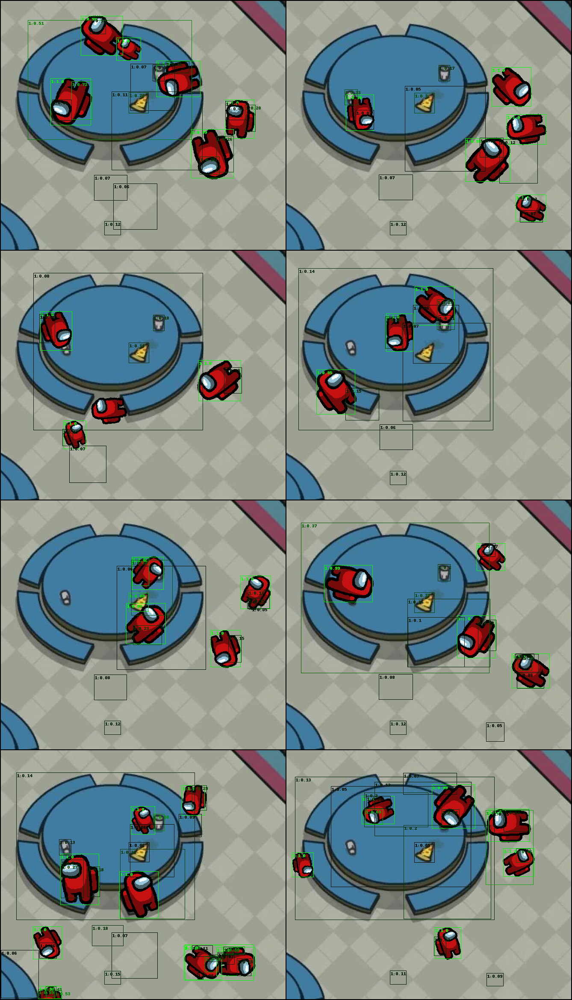

In [19]:
# Visualize a post-train prediction
nsb = next(iter(train_data))[0]
results = trainer.predict(amoug_model, DataLoader(nsb))
show(visualize(nsb, results))

In [20]:
if IN_COLAB:
  !zip -r lightning_logs.zip lightning_logs

  adding: lightning_logs/ (stored 0%)
  adding: lightning_logs/version_1/ (stored 0%)
  adding: lightning_logs/version_1/hparams.yaml (deflated 2%)
  adding: lightning_logs/version_1/events.out.tfevents.1670086338.8be683d6f39c (deflated 30%)
  adding: lightning_logs/version_1/events.out.tfevents.1670086335.8be683d6f39c (deflated 31%)
  adding: lightning_logs/version_2/ (stored 0%)
  adding: lightning_logs/version_2/events.out.tfevents.1670086900.8be683d6f39c (deflated 30%)
  adding: lightning_logs/version_2/hparams.yaml (deflated 2%)
  adding: lightning_logs/version_2/events.out.tfevents.1670086896.8be683d6f39c (deflated 31%)
  adding: lightning_logs/version_0/ (stored 0%)
  adding: lightning_logs/version_0/events.out.tfevents.1670085924.8be683d6f39c (deflated 30%)
  adding: lightning_logs/version_0/events.out.tfevents.1670085453.8be683d6f39c (deflated 31%)
  adding: lightning_logs/version_0/events.out.tfevents.1670085614.8be683d6f39c (deflated 31%)
  adding: lightning_logs/version_0/e